# 1. Setup

In [1]:
import pickle
from time import time

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor, plot_tree
import plotly.express as px
import shap
import sklearn as skl
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression, SGDRegressor, ElasticNet, BayesianRidge
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVR
from umap import UMAP
from xgboost import XGBRegressor

from utils import *

# 2. Prepare data

## 2.1. Download

In [2]:
# %%bash
# # t=0:07
# path=../data/nhts/2017
# mkdir -p $path; cd $path
# url="https://nhts.ornl.gov/assets/2016/download/csv.zip"
# wget $url
# unzip csv.zip

In [3]:
pd.read_csv('../data/nhts/trippub.csv', nrows=2)

,HOUSEID,PERSONID,TDTRPNUM,STRTTIME,ENDTIME,TRVLCMIN,TRPMILES,TRPTRANS,TRPACCMP,TRPHHACC,...,OBHTNRNT,OBPPOPDN,OBRESDN,DTHTNRNT,DTPPOPDN,DTRESDN,DTEEMPDN,DBHTNRNT,DBPPOPDN,DBRESDN
0,30000007,1,1,1000,1015,15,5.244,3,0,0,...,20,750,300,50,750,300,350,30,300,300
1,30000007,1,2,1510,1530,20,5.149,3,0,0,...,30,300,300,50,1500,750,750,20,750,300


In [4]:
def get_trip_data():
    trip = pd.read_csv('../data/nhts/trippub.csv').rename(columns=str.lower)
    df = Pdf()
    def cut(col: str, bins: list[float], labels: list[str]) -> pd.Categorical:
        return pd.cut(trip[col], [-INF] + bins + [INF], True, labels)
    def classify(col: str, mapping: dict) -> pd.Categorical:
        cats = Series(list(mapping.values())).drop_duplicates().to_list()
        return pd.Categorical(trip[col].map(mapping), categories=cats)
    ## Deterrence measures
    df['Distance'] = trip['trpmiles'] * MI2M / 1000 # in km
    df['Duration'] = trip['trvlcmin'] # in minutes
    df['Speed'] = (df.Distance / (df.Duration / 60)) # in km/h
    for col, vmax in D(Distance=200, Duration=120, Speed=100).items():
        df.loc[(df[col] <= 0) | (df[col] > vmax), col] = np.nan
    df['LogDistance'] = np.log10(1 + df.Distance * 1000) # distance in meters
    # estimated gas price in $ assuming a constant mileage of 20 mi/ga
    # df['Cost'] = (trip['gasprice'] / 100) * (df.Distance * 1000 / MI2M) / 20
    df['TripWeight'] = normalize(trip['wttrdfin'])
    ## Trip attributes
    df['HomeBased'] = (trip['trippurp'] == 'NHB').map({False: 'yes', True: 'no'})
    df['Purpose'] = classify('whytrp90', {1: 'work', 2: 'work', 3: 'shopping',
                                          4: 'social', 5: 'school/church', 6: 'medical',
                                          8: 'social', 10: 'recreation'})
    df['Mode'] = classify('trptrans', {x: 'drive' for x in [3, 4, 5, 6, 17, 18]} | 
                                      {x: 'transit' for x in [10, 11, 12, 13, 14, 15, 16]} |
                                      {1: 'walk', 2: 'bike'})
    df['VehType'] = classify('vehtype', {1: 'car', 2: 'van', 3: 'suv', 4: 'pickup'} | 
                             {x: 'other' for x in [-1, 5, 6, 7]})
    df['Weekend'] = classify('tdwknd', {1: 'yes', 2: 'no'})
    df['Occupancy'] = cut('numontrp', [1, 2], ['single', 'pair', 'multiple'])
    df['GasPrice'] = cut('gasprice', [233, 267], ['low', 'mid', 'high'])
    df['StartTime'] = (pd.cut(trip['strttime'], [0, 600, 900, 1600, 1900, 2400], labels=[
        'off_peak', 'morn_peak', 'off_peak', 'eve_peak', 'off_peak'], ordered=False)
                       .cat.reorder_categories(['morn_peak', 'eve_peak', 'off_peak']))
    df['EndTime'] = (pd.cut(trip['endtime'], [0, 600, 900, 1600, 1900, 2400], labels=[
        'off_peak', 'morn_peak', 'off_peak', 'eve_peak', 'off_peak'], ordered=False)
                       .cat.reorder_categories(['morn_peak', 'eve_peak', 'off_peak']))
    df['StayTime'] = cut('dweltime', [5, 15, 60, 480], ['very_short', 'short', 'mid', 'long', 'very_long'])
    ## SES of respondent/household
    # df['Age'] = normalize(trip['r_age'].clip(0, 80))
    df['AgeGrp'] = cut('r_age', [0, 30, 64], ['n/a', 'young', 'mid', 'senior'])
    df['Sex'] = classify('r_sex', {1: 'male', 2: 'female'})
    df['Race'] = classify('hh_race', {1: 'white'} | {x: 'nonwhite' for x in [2, 3, 4, 5, 6]})
    df['Hispanic'] = classify('hh_hisp', {1: 'yes', 2: 'no'})
    df['Education'] = cut('educ', [0, 2], ['n/a', 'school', 'college'])
    df['Worker'] = classify('worker', {1: 'yes', 2: 'no'})
    df['Income'] = cut('hhfaminc', [0, 5, 7], ['n/a', 'low', 'mid', 'high'])
    df['HomeOwn'] = classify('homeown', {1: 'own', 2: 'rent'})
    ## Origin/destination attributes
    df['Region'] = cut('census_r', [1, 2, 3], ['northeast', 'midwest', 'south', 'west'])
    df['MSAKind'] = classify('msacat', {1: 'big_rail', 2: 'big_norail', 3: 'small', 4: 'not_msa'})
    df['UrbanO'] = classify('obhur', D(C='urban', S='suburban', T='suburban', U='urban', R='rural'))
    df['UrbanD'] = classify('dbhur', D(C='urban', S='suburban', T='suburban', U='urban', R='rural'))
    df['PopDensityO'] = cut('otppopdn', [0, 1000, 4000], ['n/a', 'low', 'mid', 'high'])
    df['PopDensityD'] = cut('dtppopdn', [0, 1000, 4000], ['n/a', 'low', 'mid', 'high'])
    df['HouseDensityO'] = cut('otresdn', [0, 500, 2000], ['n/a', 'low', 'mid', 'high'])
    df['HouseDensityD'] = cut('dtresdn', [0, 500, 2000], ['n/a', 'low', 'mid', 'high'])
    df['EmpDensityO'] = cut('oteempdn', [0, 500, 2000], ['n/a', 'low', 'mid', 'high'])
    df['EmpDensityD'] = cut('dteempdn', [0, 500, 2000], ['n/a', 'low', 'mid', 'high'])
    ## Remove bad dataa
    df = df.replace('n/a', None)
    print('NaNs: ' + ' '.join([f'{k}={v:,}' for k, v in df.isna().sum().items() if v > 0]))
    df = df.dropna().reset_index(drop=1)
    for col in df.select_dtypes('object'):
        df[col] = df[col].astype(CAT)
    return df

trips = get_trip_data().disp() # t=0:09

NaNs: Distance=9,530 Duration=13,345 Speed=19,562 LogDistance=9,530 Purpose=35,779 Mode=9,540 VehType=458 StartTime=544 EndTime=473 AgeGrp=1,216 Sex=711 Race=19,553 Hispanic=1,002 Education=65,579 Worker=79,323 Income=24,340 HomeOwn=6,308 UrbanO=980 UrbanD=962 PopDensityO=973 PopDensityD=955 HouseDensityO=973 HouseDensityD=955 EmpDensityO=973 EmpDensityD=955
738,833 rows x 33 cols; Memory: 47.9 MiB


,Distance,Duration,Speed,LogDistance,TripWeight,HomeBased,Purpose,Mode,VehType,Weekend,...,Region,MSAKind,UrbanO,UrbanD,PopDensityO,PopDensityD,HouseDensityO,HouseDensityD,EmpDensityO,EmpDensityD
,<float64>,<float64>,<float64>,<float64>,<float64>,<category>,<category>,<category>,<category>,<category>,...,<category>,<category>,<category>,<category>,<category>,<category>,<category>,<category>,<category>,<category>
0,8.439379,15.0,33.757516,3.926362,0.006319,yes,school/church,drive,car,no,...,south,small,suburban,suburban,mid,low,mid,low,mid,low


In [5]:
feature_grps = pd.concat([
    Pdf(D(feature=trips.loc[:, start: end].columns)).assign(group=grp) 
    for grp, (start, end) in {
        'Trip': ('HomeBased', 'StayTime'),
        'SES': ('AgeGrp', 'HomeOwn'),
        'OD': ('Region', 'EmpDensityD')
    }.items()]).reset_index(drop=1).disp(3)

28 rows x 2 cols; Memory: 0.0 MiB


,feature,group
,<object>,<object>
0,HomeBased,Trip
1,Purpose,Trip
2,Mode,Trip


# 3. Basic analysis

In [6]:
# for col in sorted(trips.select_dtypes(CAT).columns):
#     print('*' * 50, f'{col}', sep='\n') #  (n={data[col].dropna().size:,})
#     print(', '.join([f'{k}={v:,}' for k, v in data[col].value_counts().sort_index().items()]))

## 3.1. Target vars (deterrence)

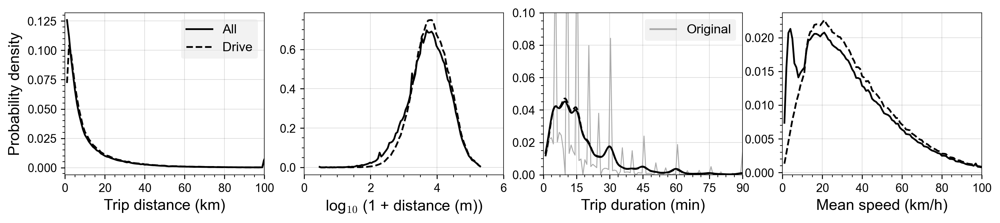

In [7]:
def fig_deterrence_distr(tds=trips, size=(14, 2.5), dpi=150):
    # sg = pd.read_parquet('../data/pois/odm2.parquet', filters=[
    #     ('duration', '>', 0), ('purpose', '==', 'Overall')
    # ], columns=['visitors', 'distance', 'duration'])
    # sg.distance /= 1000; sg.duration /= 60
    # sg['speed'] = sg.distance / sg.duration * 60
    def hist(x, vmax=None, bins=100, wt=None):
        y, x = np.histogram(x.clip(0, vmax), bins, density=True, weights=wt)
        return x[1:], y
    _, axes = plt.subplots(1, 4, figsize=size, dpi=dpi)
    drive = tds.query('Mode == "drive"')
    ## Distance
    ax = pplot(axes[0], ylog=0, xlab='Trip distance (km)',
               ylab='Probability density', xlim=(0, 100))
    ax.plot(*hist(tds.Distance, 100), color='k', ls='-', label='TDS (all)')
    ax.plot(*hist(drive.Distance, 100), color='k', ls='--', label='TDS (drive)')
    # ax.plot(*hist(sg.distance, 100), color='b', label='LBS (drive)')
    ax.legend(loc='upper right', handles=[mpl.lines.Line2D(
        [0], [0], color=c, ls=ls, label=x) for x, c, ls in [
            ('All', 'k', '-'), ('Drive', 'k', '--')]])
    ## LogDistance
    ax = pplot(axes[1], ylog=0, xlab='log$_{10}$ (1 + distance (m))',
               ylab='Probability density', xlim=(0, 6))
    ax.plot(*hist(tds.LogDistance, 100), color='k', ls='-', label='TDS (all)')
    ax.plot(*hist(drive.LogDistance, 100), color='k', ls='--', label='TDS (drive)')
    # ax.plot(*hist(np.log10(1 + sg.distance * 1000), 100), color='b', label='LBS (drive)')
    ax.set_ylabel('')
    ## Duration
    ax = pplot(axes[2], xlab='Trip duration (min)', ylim=(0, 0.1), xlim=(0, 90))
    ax.plot(*hist(tds.Duration, 90), color='#aaa', lw=0.8, label='TDS (original; all)')
    ax = sns.kdeplot(tds.Duration, ax=ax, bw_adjust=1.75, clip=(1, 90), 
                     color='k', ls='-', label='TDS (smooth; all)')
    ax = sns.kdeplot(drive.Duration, ax=ax, bw_adjust=1.75, clip=(1, 90), 
                     color='k', ls='--', label='TDS (smooth; drive)')
    ax.set_ylabel('')
    # ax.plot(*hist(sg.duration, 90), color='b', label='LBS (drive)')
    ax.set_xticks(np.arange(0, 91, 15))
    ax.legend(loc='upper right', handles=[mpl.lines.Line2D(
        [0], [0], color='#aaa', label='Original')])
    ## Speed
    ax = pplot(axes[3], xlab='Mean speed (km/h)', xlim=(0, 100))
    ax.plot(*hist(tds.Speed), color='k', ls='-', label='TDS (all)')
    ax.plot(*hist(drive.Speed), color='k', ls='--', label='TDS (drive)')
    # ax.plot(*hist(sg.speed), color='b', label='LBS (drive)')

x = fig_deterrence_distr(dpi=250); x # t=0:09

## 3.2. Covariates (discrete vars)

### 3.2.1. Sample sizes

In [8]:
def plot_sample_sizes(data, size=(14, 4), dpi=150):
    df = pd.concat([data[col].value_counts().rename_axis('subcat')
                    .reset_index().assign(cat=col) 
                    for col in data.select_dtypes(CAT)])
    df = df.sort_values('cat')
    df['label'] = df.cat + '__' + df.subcat
    df['color'] = df.cat.map(dict(zip(df.cat.unique(), sns.color_palette(
        'Set1', df.cat.nunique()))))
    ax = pplot(size=size, dpi=dpi, ylab='No. of trips', xlim=(-1, len(df)), 
               title='Sample size for classifications of measures', yeng=1)
    ax.bar(df.label, df['count'], color=df.color)
    ax.tick_params(which='minor', bottom=False)
    plt.xticks(rotation=90)

# plot_sample_sizes(trips, dpi=150)

## 3.3. Interactive distributions

In [9]:
def plot_distr_vars(data=trips, width=1600, height=500):
    res = []
    for measure, vmin, vmax in [('Duration', 0, 90), ('LogDistance', 1, 6), ('Speed', 0, 80)]:
        for var in data.select_dtypes(CAT):
            for cat, df in data.groupby(var):
                y, x = np.histogram(df[measure].clip(vmin, vmax), 
                                    bins=100, weights=df.TripWeight)
                y = (y / y.sum()).cumsum()
                res.append(Pdf(D(value=x[1:], density=y))
                           .assign(var=var, cat=cat, measure=measure))
    res = pd.concat(res).reset_index(drop=1)
    fig = px.line(res, x='value', y='density', color='var', facet_col='measure',
                  width=width, height=height, hover_name='cat', hover_data=['cat'],
                  labels=D(density='Cumulative probability density', var='Factor'))
    fig.update_layout(hoverlabel=D(bgcolor='white', font_size=16),
                      font=D(family='Arial', size=18))
    fig.for_each_xaxis(lambda x: x.update(matches=None))
    fig.show()

plot_distr_vars()

# 4. Select regression model

## 4.1. Define test models, datasets & metrics

In [10]:
class Dataset:
    def __init__(self, target, test_ratio, n=None, 
                 wide=True, factors=[], data=trips, seed=1234):
        rng = D(LogDistance=(2, 5), Duration=(0, 90))[target]
        if isinstance(n, int):
            data = data.sample(n, random_state=seed)
        self.X = data.select_dtypes(CAT)
        if type(factors) in [list, set, tuple] and len(factors) > 0:
            self.X = self.X[list(factors)]
        if wide:
            self.X = pd.get_dummies(self.X, prefix_sep='__')
        self.y = normalize(data[target], *rng)
        self.Xtrain, self.Xtest, self.ytrain, self.ytest = train_test_split(
                self.X, self.y, test_size=test_ratio, random_state=seed)
        wts = data['TripWeight'].rename('weight')
        self.wtrain = wts.loc[self.Xtrain.index]
        self.wtest = wts.loc[self.Xtest.index]

ds_full = {x: Dataset(x, 0.3) for x in ['LogDistance', 'Duration']}
ds_mini = {x: Dataset(x, 0.3, n=10_000) for x in ['LogDistance', 'Duration']}

In [11]:
test_models = (
    ## Linear models
    ('Linear Regression', LinearRegression(), D(
        fit_intercept=[True, False],
    )),
    ('Bayesian Ridge', BayesianRidge(max_iter=1000), D(
        alpha_1=[.5e-6, 1e-6, 2e-6],
        alpha_2=[.5e-6, 1e-6, 2e-6],
        lambda_1=[.5e-6, 1e-6, 2e-6],
        lambda_2=[.5e-6, 1e-6, 2e-6],
    )),
    ('SGD Regression', SGDRegressor(max_iter=1000), D(
        alpha=[1e-05, 0.0001, 0.001, 0.01],
        l1_ratio=[0.1, 0.15, 0.2, 0.3],
        penalty=['l2', 'elasticnet'],
    )),
    ## Kernel models
    ('Kernel Ridge', KernelRidge(), D(
        alpha=[0.1, 0.5, 1.0, 2.0],
        degree=[2, 3, 4, 5],
        kernel=['linear', 'poly', 'rbf'],
    )),
    ('SVR', SVR(max_iter=10000), D(
        C=[0.5, 1.0, 1.5],
        degree=[2, 3, 4, 5],
        gamma=['scale', 'auto'],
        kernel=['linear', 'poly', 'rbf'],
    )),
    ## Decision tree models
    ('Light Gradient Boost', LGBMRegressor(n_jobs=12), D(
        boosting_type=['gbdt', 'rf'],
        learning_rate=[0.05, 0.1, 0.5],
        max_depth=[10, 20, 30, 40],
        n_estimators=[100, 200, 500, 750],
    )),
    ('Extreme Gradient Boost', XGBRegressor(n_jobs=12), D(
        booster=['gbtree', 'gblinear'],
        learning_rate=[0.05, 0.1, 0.5],
        max_depth=[10, 20, 30, 40],
        n_estimators=[100, 200, 500, 750, 1000],
    )),
)

In [12]:
metrics = D(r2=r2_score, mae=mean_absolute_error, mse=mean_squared_error)

## 4.2. Cross validate models on mini dataset

In [13]:
def compare_reg_mini(models, datasets, metrics=metrics, overwrite=False):
    outpath = Path(f'../data/result/model_comparison_mini.pickle')
    if outpath.exists() and not overwrite:
        return pd.read_pickle(outpath)
    res = []
    pbar = tqdm(list(it.product(models, datasets.items())))
    for (name, model, params), (target, ds) in pbar:
        pbar.set_description(f'{target}: {name}')
        cv = GridSearchCV(model, params, cv=5, n_jobs=6)
        cv.fit(ds.Xtrain, ds.ytrain)
        runtime = cv.cv_results_['mean_fit_time'].mean()
        row = D(target=target, model=name, cv=cv, runtime=runtime)
        best = cv.best_estimator_
        ypred = best.predict(ds.Xtest)
        for metric, func in metrics.items():
            row[metric] = func(ds.ytest, ypred)
        res.append(row)
    res = Pdf(res)
    res.to_pickle(mkfile(outpath))
    return res

res_mini = compare_reg_mini(test_models, ds_mini, overwrite=0).disp() # t=10:44

14 rows x 7 cols; Memory: 0.0 MiB


,target,model,cv,runtime,r2,mae,mse
,<object>,<object>,<object>,<float64>,<float64>,<float64>,<float64>
0,LogDistance,Linear Regression,"GridSearchCV(cv=5, estimator=LinearRegression(...",0.063345,0.313415,0.13501,0.029829


## 4.3. Compare models on main dataset

In [14]:
def compare_reg_full(cv_df, datasets, metrics=metrics, overwrite=False):
    outpath = Path(f'../data/result/model_comparison_full.csv')
    if outpath.exists() and not overwrite:
        return pd.read_csv(outpath)
    res = []
    pbar = tqdm(list(cv_df.iterrows()))
    for _, r in pbar:
        pbar.set_description(f'{r.target}: {r.model}')
        ds = datasets[r.target]
        model = r.cv.best_estimator_
        row = D(target=r.target, model=r.model)
        ypred = model.predict(ds.X)
        for metric, func in metrics.items():
            row[metric] = func(ds.y, ypred)
        res.append(row)
    res = Pdf(res)
    res.to_csv(mkfile(outpath), index=False)
    return res

res_full = compare_reg_full(res_mini, ds_full, overwrite=0).disp() # t=9:30

14 rows x 5 cols; Memory: 0.0 MiB


,target,model,r2,mae,mse
,<object>,<object>,<float64>,<float64>,<float64>
0,LogDistance,Linear Regression,0.318894,0.130958,0.028037


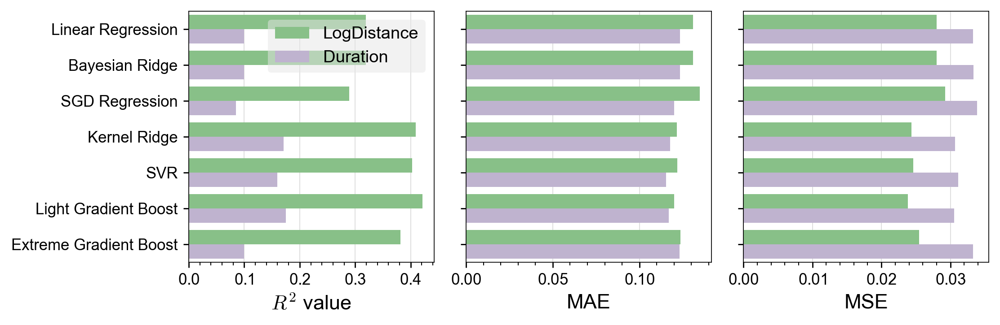

In [15]:
def fig_compare_models(res, size=(9, 3), dpi=150):
    _, axes = plt.subplots(1, 3, figsize=size, dpi=dpi)
    for i, (metric, label) in enumerate([
            ('r2', '$R^2$ value'), ('mae', 'MAE'), ('mse', 'MSE')]):
        ax = pplot(axes[i], xlab=label, yminor=0)
        sns.barplot(res, ax=ax, x=metric, y='model', hue='target', palette='Accent')
        ax.set_ylabel('')
        if i == 0:
            ax.legend_.set_title(None)
        if i > 0:
            ax.legend_.remove()
            ax.set_yticklabels([])
    plt.tight_layout()
    
# fig_compare_models(res_mini, dpi=250)
fig_compare_models(res_full, dpi=250)

## 4.4. Fit the best model

In [16]:
# t=0:06
best_model_kind = 'Light Gradient Boost'
models = {} # finally selected models
for target in tqdm(['LogDistance', 'Duration']):
    ds = ds_full[target]
    params = (res_mini.query(f'model=="{best_model_kind}" & target=="{target}"')
              .iloc[0].cv.best_params_)
    model = LGBMRegressor(**(params | D(max_depth=-1)), 
                          n_jobs=-1, force_row_wise=True, verbosity=0)
    model.fit(ds.Xtrain, ds.ytrain)
    r2 = r2_score(ds.ytest, model.predict(ds.Xtest))
    print(f'Model R2 value for {target}: {r2:.3f}')
    models[target] = model
models['Duration']

  0%|          | 0/2 [00:00<?, ?it/s]

Model R2 value for LogDistance: 0.450


Model R2 value for Duration: 0.213


LGBMRegressor(force_row_wise=True, learning_rate=0.05, n_jobs=-1, verbosity=0)

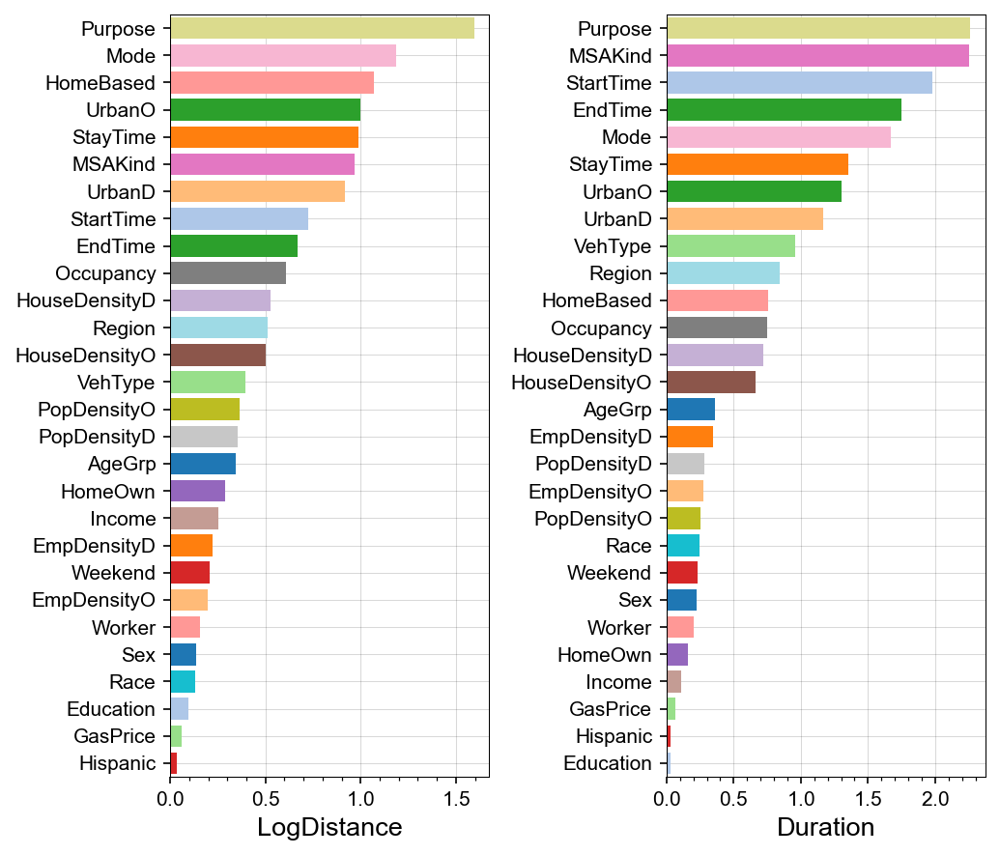

In [17]:
def plot_feature_importance(models, size=(7, 6), dpi=150):
    _, axes = plt.subplots(1, 2, figsize=size, dpi=dpi)
    for i, (target, model) in enumerate(models.items()):
        df = Pdf(D(factor=model.feature_name_, imp=normalize(model.feature_importances_)))
        df['feature'], df['level'] = list(zip(*df.factor.str.split('__')))
        df = df.groupby('feature')['imp'].sum().sort_values().reset_index()
        df['color'] = df.feature.astype(CAT).cat.codes.map(dict(enumerate(
            sns.color_palette('tab20', df.feature.nunique())))).apply(mpl.colors.to_hex)
        ax = pplot(axes[i], xlab=target, yminor=0)
        ax.set_ylim(-0.5, len(df) - 0.5)
        ax.barh(df.feature, df.imp, color=df.color);
    plt.tight_layout()

plot_feature_importance(models)

# 5. SHAP analysis

## 5.1. Row-wise SHAP values

### 5.1.1. For factor levels

In [18]:
def get_shap(models, datasets, seed=1234, overwrite=False):
    outpath = Path('../data/result/shap_levels.parquet')
    if outpath.exists() and not overwrite:
        return pd.read_parquet(outpath)
    res = []
    for target in tqdm(['LogDistance', 'Duration']):
        ds, model = datasets[target], models[target]
        explainer = shap.TreeExplainer(model, seed=seed)
        shaps = explainer(ds.X).values
        df = Pdf(shaps, columns=ds.X.columns).astype(np.float32)
        df = df.rename_axis('row_id').reset_index().astype(D(row_id=np.int32))
        df.insert(0, 'target', target)
        res.append(df)
    res = pd.concat(res).reset_index(drop=1).astype(D(target=CAT))
    res.to_parquet(mkfile(outpath))
    return res

shap_level = get_shap(models, ds_full, overwrite=0).disp() # t=1:18

1,477,666 rows x 88 cols; Memory: 491.8 MiB


,target,row_id,HomeBased__no,HomeBased__yes,Purpose__work,Purpose__shopping,Purpose__social,Purpose__school/church,Purpose__medical,Purpose__recreation,...,HouseDensityO__high,HouseDensityD__low,HouseDensityD__mid,HouseDensityD__high,EmpDensityO__low,EmpDensityO__mid,EmpDensityO__high,EmpDensityD__low,EmpDensityD__mid,EmpDensityD__high
,<category>,<int32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,...,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
0,LogDistance,0,0.009146,0.001323,-0.011843,0.005703,0.001283,0.003094,-0.001555,-0.000953,...,0.000086,0.027035,0.000135,0.000139,0.00023,0.000059,-0.000059,0.000062,0.000012,-0.000086


### 5.1.2. For features

In [19]:
# t=0:07
# shap_feature = shap_level[['target', 'row_id']]
# for feat in feature_grps.feature:
#     col = np.abs(shap_level.filter(like=feat + '__')).sum(1).rename(feat)
#     shap_feature = pd.concat([shap_feature, col], axis=1)
# shap_feature.to_parquet('../data/result/shap_features.parquet')
shap_feature = pd.read_parquet('../data/result/shap_features.parquet').disp()

1,477,666 rows x 30 cols; Memory: 164.9 MiB


,target,row_id,HomeBased,Purpose,Mode,VehType,Weekend,Occupancy,GasPrice,StartTime,...,Region,MSAKind,UrbanO,UrbanD,PopDensityO,PopDensityD,HouseDensityO,HouseDensityD,EmpDensityO,EmpDensityD
,<category>,<int32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,...,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
0,LogDistance,0,0.010469,0.024432,0.031936,0.00132,0.000754,0.011589,0.000061,0.005737,...,0.008235,0.018539,0.009317,0.007385,0.001875,0.005211,0.006674,0.027309,0.000349,0.00016


In [20]:
shap_feature_contrib = (shap_feature.drop(columns='row_id').groupby('target')
                        .apply(np.mean).reset_index()
                        .melt('target', var_name='feature', value_name='abs_shap')).disp()

2 rows x 3 cols; Memory: 0.0 MiB


,target,feature,abs_shap
,<category>,<object>,<float32>
0,Duration,0,0.006568


In [ ]:
shap_feature_contrib.abs_shap

## 5.2. Intra- and inter-feature importance

/home/umni2/a/umnilab/users/verma99/anaconda3/envs/mk11/lib/python3.11/site-packages/matplotlib/ticker.py:2937: RuntimeWarning:

invalid value encountered in log10



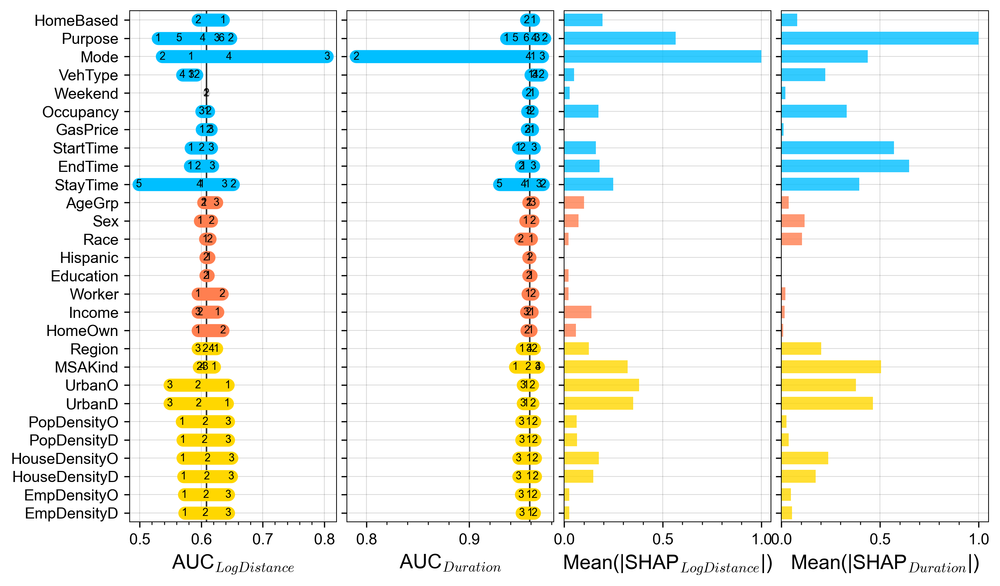

In [22]:
def fig_feature_selection(trips, shaps, grps=feature_grps, win=5,
                          size=(10, 6), dpi=150):
    pts = [] # table for distributional summary value for each factor level
    features = trips.select_dtypes(CAT).columns
    mean_auc = {}
    for target, vmin, vmax in [('Duration', 0, 90), ('LogDistance', 2, 5)]:
        def auc(df): # area under curve of CDF
            y, x = np.histogram(df[target].clip(vmin, vmax + win), 
                                bins=100, weights=df.TripWeight, density=1)
            y = Series(y[::-1]).rolling(win).median()[::-1].fillna(0)
            F = (y / y.sum()).cumsum() # CDF
            return (F * x[:-1]).sum() / x[:-1].sum() # area under curve of CDF
        mean_auc[target] = auc(trips)
        for feat in features: # for each feature
            for j, (cat, df) in enumerate(trips.groupby(feat)): # for each level
                if feat == 'VehType' and cat == 'other': continue
                pts.append(D(target=target, feature=feat, cat_id=j, cat=cat, value=auc(df)))
    pts = Pdf(pts)
    res = (pts.groupby(['target', 'feature'])['value'].agg(['min', 'max'])
           .rename(columns='auc_{}'.format).reset_index()
           .merge(shaps, on=('target', 'feature')))
    res = res.merge(grps, on='feature')
    res.feature = pd.Categorical(res.feature, categories=features)
    res['color'] = res.group.map(D(Trip='deepskyblue', SES='coral', OD='gold'))
    res['pos'] = len(features) - res.feature.cat.codes - 1
    _, axes = plt.subplots(1, 4, figsize=size, dpi=dpi, sharey=True)
    for i, (target, vmax) in enumerate([('LogDistance', 0.3), ('Duration', 0.2)]):
        ## AUC
        ax = pplot(axes[i], xlab='AUC$_{%s}$' % target, xlog=0)
        df = pts.merge(res, on=('target', 'feature')).query(f'target=="{target}"')
        ax.scatter(df.value, df.pos, s=15, color='#ccc')
        ax.axvline(mean_auc[target], ls='-', color='k', lw=1, alpha=0.8)
        for _, r in df.iterrows():
            ax.text(r.value, r.pos, str(r.cat_id + 1), fontsize=7,
                    color='k', ha='center', va='center')
        df = res[res['target'] == target].sort_values('feature')
        for _, r in df.iterrows():
            ax.add_artist(mpl.lines.Line2D(
                [r.auc_min, r.auc_max], [r.pos] * 2, lw=8.5,
                alpha=1, color=r.color, solid_capstyle='round'))
        ## SHAP values
        ax = pplot(axes[i + 2], xlab='Mean(|SHAP$_{%s}$|)' % target)
        ax.barh(df.pos, df.abs_shap, tick_label=df.feature, 
                color=df.color, alpha=0.8, height=0.7)
    for i, ax in enumerate(axes):
        ax.set_ylim(-0.5, len(features) - 0.5)
        ax.tick_params(which='minor', left=False)
    plt.subplots_adjust(wspace=0.05)

x = fig_feature_selection(trips, shap_feature_contrib, dpi=300); x # t=0:05

In [ ]:
def fig_feature_selection2(trips, shaps, grps=feature_grps, win=5,
                          size=(10, 4), dpi=150):
    features = trips.select_dtypes(CAT).columns
    ax = pplot(size=size, dpi=dpi)
    # _, axes = plt.subplots(1, 2, figsize=size, dpi=dpi, sharey=True)
    for i, (target, vmax) in enumerate([('LogDistance', 0.3), ('Duration', 0.2)]):
        ## AUC
        ax = pplot(axes[i], xlab='AUC$_{%s}$' % target, xlog=0)
        df = pts.merge(res, on=('target', 'feature')).query(f'target=="{target}"')
        ax.scatter(df.value, df.pos, s=15, color='#ccc')
        ax.axvline(mean_auc[target], ls='-', color='k', lw=1, alpha=0.8)
        df = res[res['target'] == target].sort_values('feature')
        for _, r in df.iterrows():
            ax.add_artist(mpl.lines.Line2D(
                [r.auc_min, r.auc_max], [r.pos] * 2, lw=8.5,
                alpha=1, color=r.color, solid_capstyle='round'))
        ## SHAP values
        ax = pplot(axes[i + 2], xlab='Mean(|SHAP$_{%s}$|)' % target)
        ax.barh(df.pos, df.abs_shap, tick_label=df.feature, 
                color=df.color, alpha=0.8, height=0.7)
    for i, ax in enumerate(axes):
        ax.set_ylim(-0.5, len(features) - 0.5)
        ax.tick_params(which='minor', left=False)
    plt.subplots_adjust(wspace=0.05)

x = fig_feature_selection2(trips, shap_feature_contrib, dpi=300); x # t=0:05

## 5.3. Important distributions

In [25]:
def plot_distr_box(data=trips, size=(9, 5), dpi=150):
    _, axes = plt.subplots(1, 3, figsize=size, dpi=dpi,
                           gridspec_kw=D(width_ratios=[1.2, 1, 1]))
    cols = D(Mode='crimson', Purpose='dodgerblue', Race='limegreen',
             Income='orange', UrbanO='orchid', StayTime='teal')
    ticker = mpl.ticker.EngFormatter(places=1)
    for j, (var, rng) in enumerate([('Distance', (0.1, 1000)),
                                    ('Duration', (0, 90)), ('Speed', (0, 80))]):
        df = Pdf(sum([[D(col=col, cat=x[0].title().replace('_', ' '),
                         vals=x[1].values, pos=i / 2, n=ticker(len(x[1]))) 
                       for x in data.groupby(col)[var]]
                      for i, col in enumerate(cols.keys())], []))
        df.vals = [x.clip(*rng) for x in df.vals]
        df['color'] = df.col.map(cols)
        ax = pplot(axes[j], xlog=var == 'Distance')
        x = ax.boxplot(df.vals, positions=df.pos + df.index,
                       labels=df.cat,# + ' (' + df.n + ')',
                       vert=False, whiskerprops=D(lw=0.5), boxprops=D(lw=1.2),
                       flierprops=D(markersize=2, markeredgecolor='#bbb1'),
                       showmeans=True, meanline=False, meanprops=D(
                           marker='o', markersize=4, 
                           markeredgecolor='none', markerfacecolor='k'),
                       medianprops=D(color='k'))
        for box, color in zip(x['boxes'], df.color):
            box.set_color(color)
        ax.tick_params(which='minor', left=False)
        ax.invert_yaxis()
        if var == 'Duration': ax.set_xticks(np.arange(0, 91, 15))
        if j != 0: ax.set_yticklabels([])
    plt.tight_layout()

# x = plot_distr_box(dpi=150); x

# 6. OD: Density & urbanity

In [78]:
od_cols = pd.get_dummies(trips[feature_grps.query('group=="OD"').feature], prefix_sep='__').columns

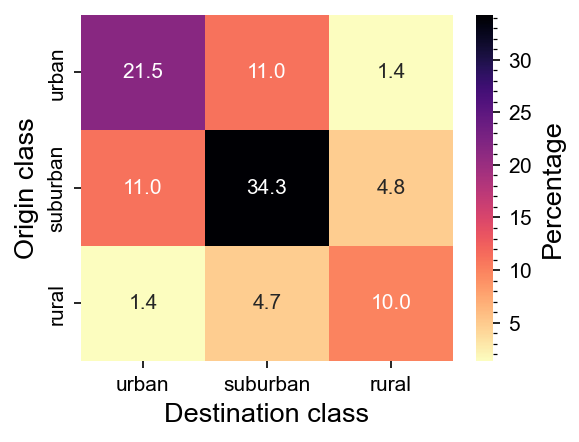

In [80]:
ax = pplot(size=(4, 3), dpi=150)
sns.heatmap(trips[['UrbanO', 'UrbanD']].value_counts()
            .pipe(lambda x: x / x.sum() * 100).reset_index()
            .pivot_table('count', 'UrbanO', 'UrbanD'),
            ax=ax, cmap='magma_r', annot=True, fmt='.1f',
            cbar_kws=D(label='Percentage'))
ax.minorticks_off(); ax.grid(False)
ax = pplot(ax, xlab='Destination class', ylab='Origin class')

In [27]:
trips[feature_grps.query('group=="OD"')['feature']].value_counts()

Region  MSAKind     UrbanO    UrbanD    PopDensityO  PopDensityD  HouseDensityO  HouseDensityD  EmpDensityO  EmpDensityD
west    big_rail    urban     urban     high         high         high           high           high         high           16583
south   big_norail  suburban  suburban  mid          mid          mid            mid            mid          mid            16106
        not_msa     rural     rural     low          low          low            low            low          low            14522
        small       suburban  suburban  low          low          low            low            low          low            14333
                                        mid          mid          mid            mid            mid          mid            12989
                                                                                                                            ...  
        big_rail    suburban  suburban  high         high         low            mid            mid

# 7. SES

In [98]:
# ses_cols = pd.get_dummies(trips[feature_grps.query('group=="SES"').feature], prefix_sep='__').columns
ses_feats = ('AgeGrp', 'Race', 'Sex', 'HomeOwn', 'Income')

In [134]:
def get_distr_auc(target, feats=ses_feats, trips=trips, models=models):
    X, y = pd.get_dummies(trips[list(feats)], prefix_sep='__'), trips[target]
    # X, y = trips[list(feats)], trips[target]
    # cats = X.apply(lambda x: list(x.cat.categories))
    # return cats
    # return list(it.product(*[[f'{k}__{z}' for z in v] for k, v in cats.items()]))
    # n_combs = np.prod(cats.apply(len))
    # for col in X.columns:
    #     return X[col].cat.categories
    # LGBMRegressor(n_jobs=-1, )
    model = models[target].fit(X, y)
    r2 = r2_score(y, model.predict(X))
    print(f'R2 value: {r2:.3f}')
    return model

x = get_distr_auc('Duration'); x

R2 value: 0.007


LGBMRegressor(force_row_wise=True, learning_rate=0.05, n_jobs=-1, verbosity=0)

In [ ]:
x.predict()

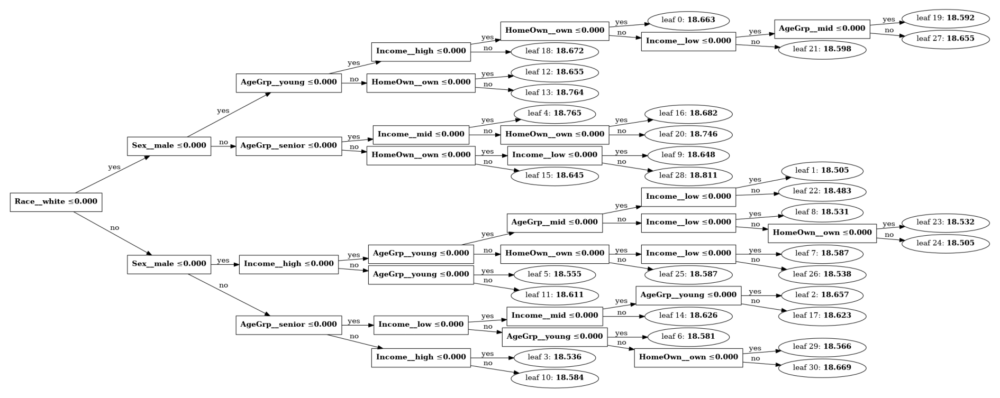

In [132]:
ax = pplot(size=(16, 8), dpi=150)
plot_tree(x, ax=ax);

In [89]:
def get_ses_shap(target, shaps=shap_level, trips=trips, groups=feature_grps):
    features = groups.query(f'group=="SES"').feature
    cols = pd.get_dummies(trips[features], prefix_sep='__').columns
    sh = shaps.query(f'target=="{target}"').set_index('row_id')[cols]
    return sh

# sh_ses = get_ses_shap('Duration').disp()
x = get_ses_shap('Duration'); x

,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
row_id,,,,,,,,,,,,,,,,,,
0,0.000054,-0.000306,0.000467,-0.002458,-0.000242,0.012877,0.000329,-0.000034,0.0,-0.000011,0.0,0.000308,0.000163,0.000045,1.513799e-06,-0.000182,0.000099,0.0
1,0.000056,-0.000298,0.000469,-0.002797,-0.000228,0.013004,0.000116,-0.000032,0.0,-0.000017,0.0,0.000328,0.000037,0.000046,9.874270e-07,-0.000195,0.000095,0.0
2,0.000078,-0.001278,0.000373,0.003155,0.000355,0.010993,0.001002,-0.000034,0.0,-0.000011,0.0,-0.000385,-0.000010,0.000153,1.424794e-06,-0.000475,0.000166,0.0
3,-0.000316,-0.000299,-0.000137,-0.002354,-0.000248,0.012268,0.000329,-0.000033,0.0,0.000041,0.0,0.000379,0.000033,0.000045,1.424794e-06,-0.000168,0.000097,0.0
4,-0.000218,-0.000298,-0.000152,-0.002853,-0.000239,0.013225,0.000116,-0.000032,0.0,0.000044,0.0,0.000313,0.000037,0.000046,9.874270e-07,-0.000174,0.000093,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738828,0.000190,0.000459,-0.000160,0.002788,0.000188,-0.002034,-0.000078,-0.000126,0.0,-0.000019,0.0,-0.003876,-0.000044,0.000286,-3.561675e-06,-0.000391,0.001027,0.0
738829,0.000120,0.000175,-0.000131,0.003135,0.000320,-0.002181,-0.000074,-0.000120,0.0,-0.000011,0.0,-0.002687,-0.000054,0.000045,-3.846288e-06,0.000193,0.000676,0.0
738830,0.000120,0.000175,-0.000134,0.002493,0.000320,-0.002177,-0.000074,-0.000120,0.0,-0.000011,0.0,-0.003205,-0.000328,0.000047,-3.846288e-06,0.000194,0.000723,0.0


In [26]:
pca = skl.decomposition.PCA(2).fit(sh_ses)
df = Pdf(pca.transform(sh_ses), columns=['pc1', 'pc2']).disp()

738,833 rows x 2 cols; Memory: 5.6 MiB


,pc1,pc2
,<float32>,<float32>
0,0.013188,-0.002287


In [27]:
pca.components_

array([[-2.1041618e-03,  4.6860417e-03, -7.6738778e-03, -1.2599149e-02,
        -1.3798632e-03,  9.9980694e-01, -0.0000000e+00, -1.7937562e-04,
        -0.0000000e+00,  3.9250223e-04, -0.0000000e+00,  2.3808966e-03,
        -3.2428397e-05, -1.9538722e-03, -3.4852706e-05, -2.5101330e-03,
        -1.1144590e-02, -0.0000000e+00],
       [ 2.8749573e-04,  3.2572460e-04,  8.7974817e-03,  9.9784815e-01,
         6.2689632e-02,  1.2799512e-02, -0.0000000e+00, -1.4261066e-04,
        -0.0000000e+00,  4.1026797e-04, -0.0000000e+00, -7.1048704e-03,
        -7.6508080e-04,  5.3474070e-03,  3.4004738e-06,  6.4008939e-03,
         2.5727737e-03, -0.0000000e+00]], dtype=float32)

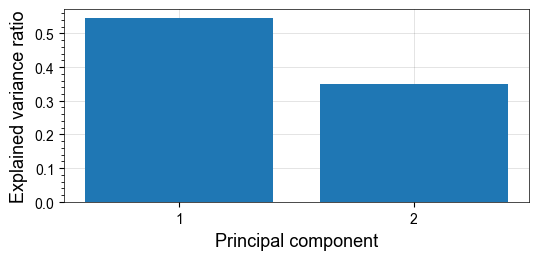

In [29]:
ax = pplot(size=(5, 5), dpi=100)
ax.pie(pca.explained_variance_ratio_, autopct='%.1f');

In [30]:
comp = Pdf(pca.components_, index=['pc1', 'pc2'], columns=sh_ses.columns).disp(None)

2 rows x 18 cols; Memory: 0.0 MiB


col,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
pc1,-0.002104,0.004686,-0.007674,-0.012599,-0.00138,0.999807,-0.0,-0.000179,-0.0,0.000393,-0.0,0.002381,-0.000032,-0.001954,-0.000035,-0.00251,-0.011145,-0.0
pc2,0.000287,0.000326,0.008797,0.997848,0.06269,0.0128,-0.0,-0.000143,-0.0,0.00041,-0.0,-0.007105,-0.000765,0.005347,0.000003,0.006401,0.002573,-0.0


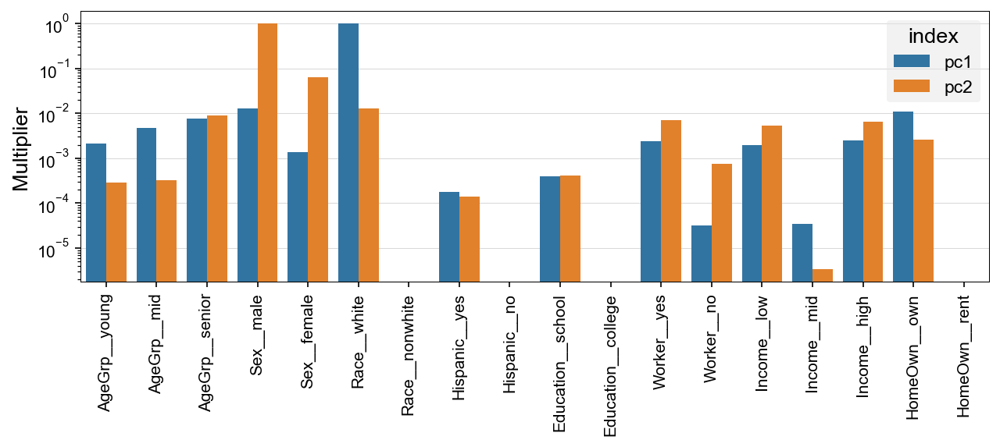

In [36]:
ax = pplot(size=(10, 3), dpi=150, ylog=1, xminor=0)
sns.barplot(np.abs(comp).reset_index().melt('index'), ax=ax, x='col', y='value', hue='index')
plt.xticks(rotation=90); ax.set_xlabel(''); ax.set_ylabel('Multiplier');

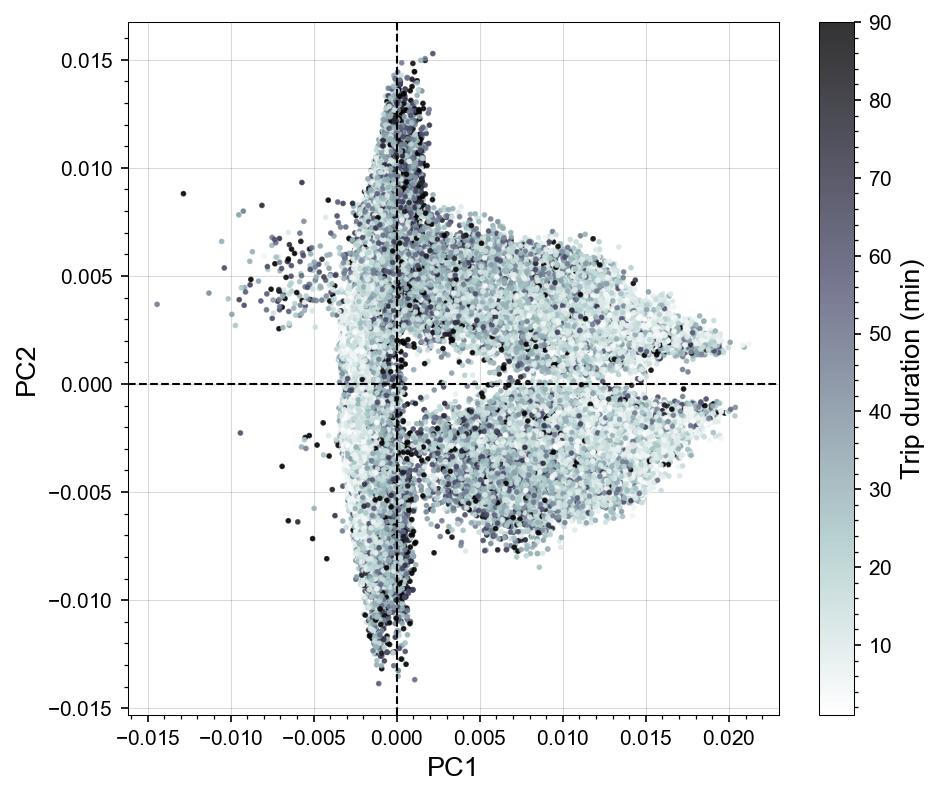

In [37]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.Duration.clip(0, 90), cmap='bone_r', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Trip duration (min)')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

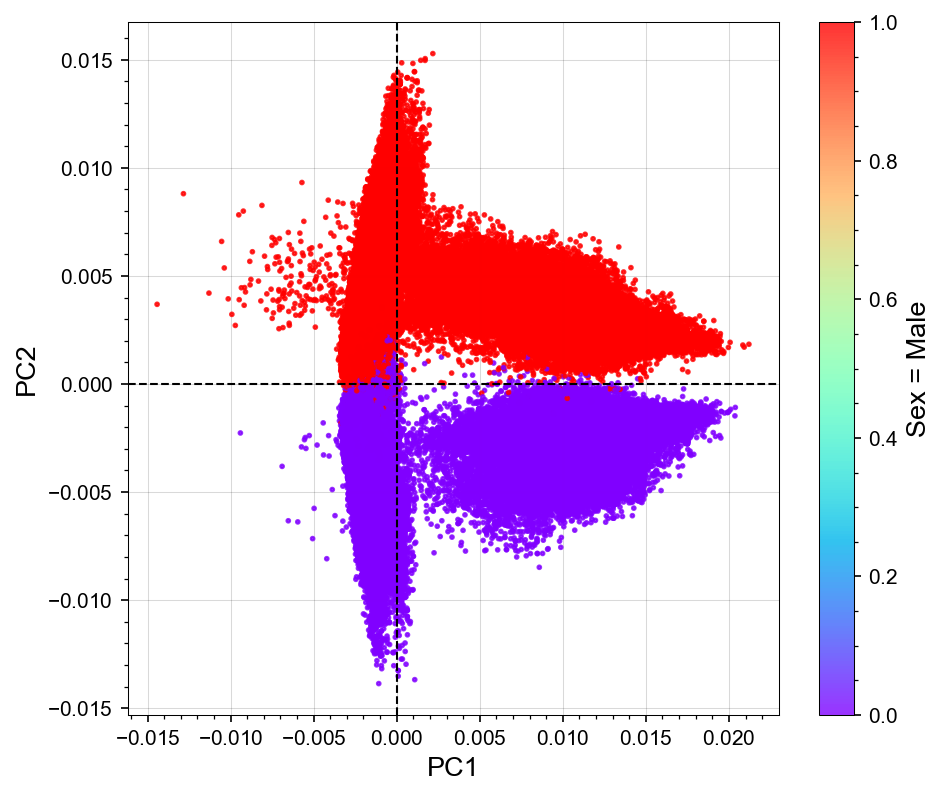

In [38]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.Sex == 'male', cmap='rainbow', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Sex = Male')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

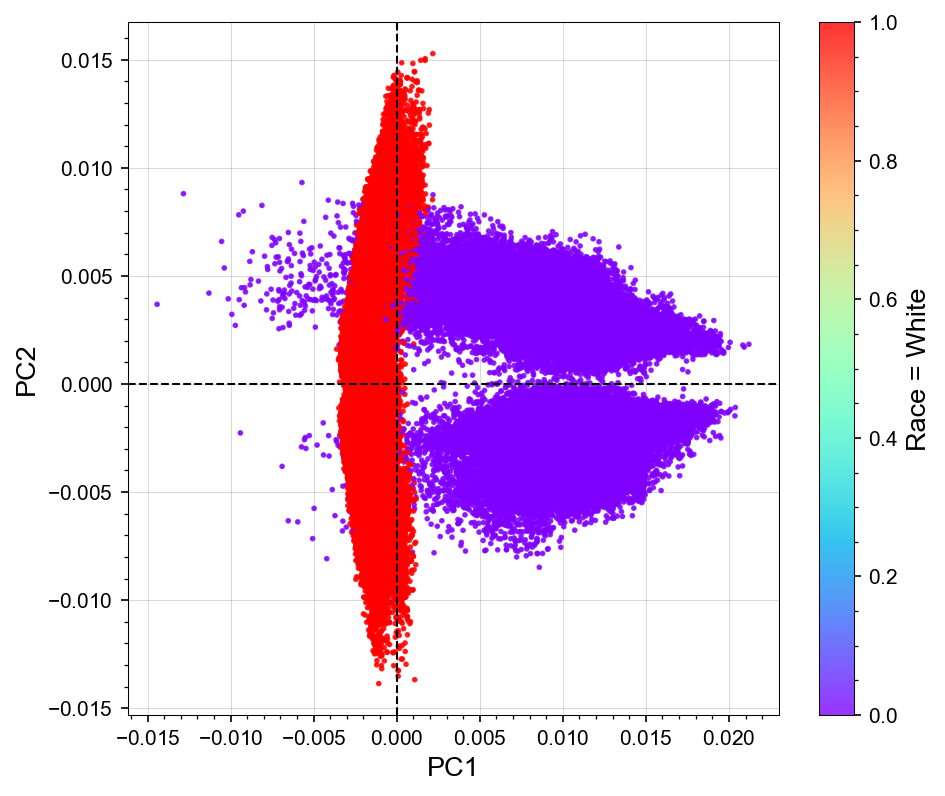

In [39]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.Race == 'white', cmap='rainbow', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Race = White')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

In [40]:
def get_ses_shap(target, shaps=shap_level, trips=trips, groups=feature_grps):
    sh = shaps.query(f'target=="{target}"')
    sh = sh.assign(feature=sh.col.map(lambda x: x.split('__')[0]))
    sh = sh.merge(groups.query('group=="SES"')['feature'])
    sh = sh.pivot_table('shap', 'row_id', 'col')
    return sh

sh_ses = get_ses_shap('LogDistance').disp()

738,833 rows x 18 cols; Memory: 53.6 MiB


col,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
row_id,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
0,-0.002361,-0.000157,-0.012516,-0.003841,-0.000363,0.005457,0.000217,0.000012,0.0,0.001441,0.000076,-0.000777,-0.000038,0.004981,0.000008,-0.003121,0.002465,0.000147


In [48]:
pca = skl.decomposition.PCA(18).fit(sh_ses)
df = Pdf(pca.transform(sh_ses)).disp()

738,833 rows x 18 cols; Memory: 50.7 MiB


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
0,-0.001413,0.013037,-0.002274,0.005578,-0.003239,-0.002157,0.005698,-0.001128,-0.000719,-0.000085,0.000025,0.000176,0.000008,-0.000009,0.0,-0.000133,0.000012,-0.0


In [42]:
pca.components_

array([[ 6.38036197e-03, -7.83058535e-03, -2.12070614e-01,
        -6.01744689e-02, -8.94720852e-03,  2.37707794e-02,
         1.14594412e-03, -8.89745075e-04, -1.08420217e-19,
        -5.14638163e-02, -2.69357720e-03, -5.54345883e-02,
        -2.73241685e-03, -8.98955107e-01, -6.76974014e-04,
        -2.56936640e-01, -2.65473276e-01, -1.75056588e-02],
       [-1.18848659e-01, -1.80250369e-02, -8.95536005e-01,
         3.11953649e-02,  4.98275133e-03, -4.69665229e-02,
        -2.62308796e-03,  2.44124816e-03, -1.11022302e-16,
         7.25144800e-03,  1.85248151e-04, -1.13588683e-01,
        -6.29708031e-03,  1.03050254e-01,  2.40254012e-04,
        -2.18320712e-02,  3.94454718e-01,  2.57727075e-02]], dtype=float32)

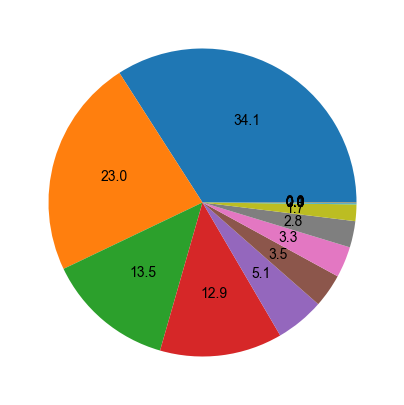

In [53]:
ax = pplot(size=(5, 5), dpi=100)
ax.pie(pca.explained_variance_ratio_, autopct='%.1f');

In [44]:
comp = Pdf(pca.components_, index=['pc1', 'pc2'], columns=sh_ses.columns).disp(None)

2 rows x 18 cols; Memory: 0.0 MiB


col,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
pc1,0.00638,-0.007831,-0.212071,-0.060174,-0.008947,0.023771,0.001146,-0.00089,-0.0,-0.051464,-0.002694,-0.055435,-0.002732,-0.898955,-0.000677,-0.256937,-0.265473,-0.017506
pc2,-0.118849,-0.018025,-0.895536,0.031195,0.004983,-0.046967,-0.002623,0.002441,-0.0,0.007251,0.000185,-0.113589,-0.006297,0.10305,0.00024,-0.021832,0.394455,0.025773


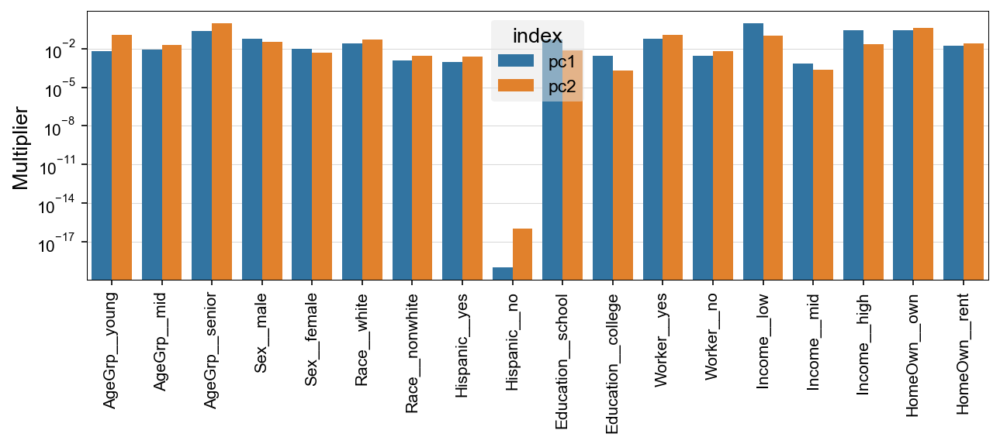

In [45]:
ax = pplot(size=(10, 3), dpi=150, ylog=1, xminor=0)
sns.barplot(np.abs(comp).reset_index().melt('index'), ax=ax, x='col', y='value', hue='index')
plt.xticks(rotation=90); ax.set_xlabel(''); ax.set_ylabel('Multiplier');

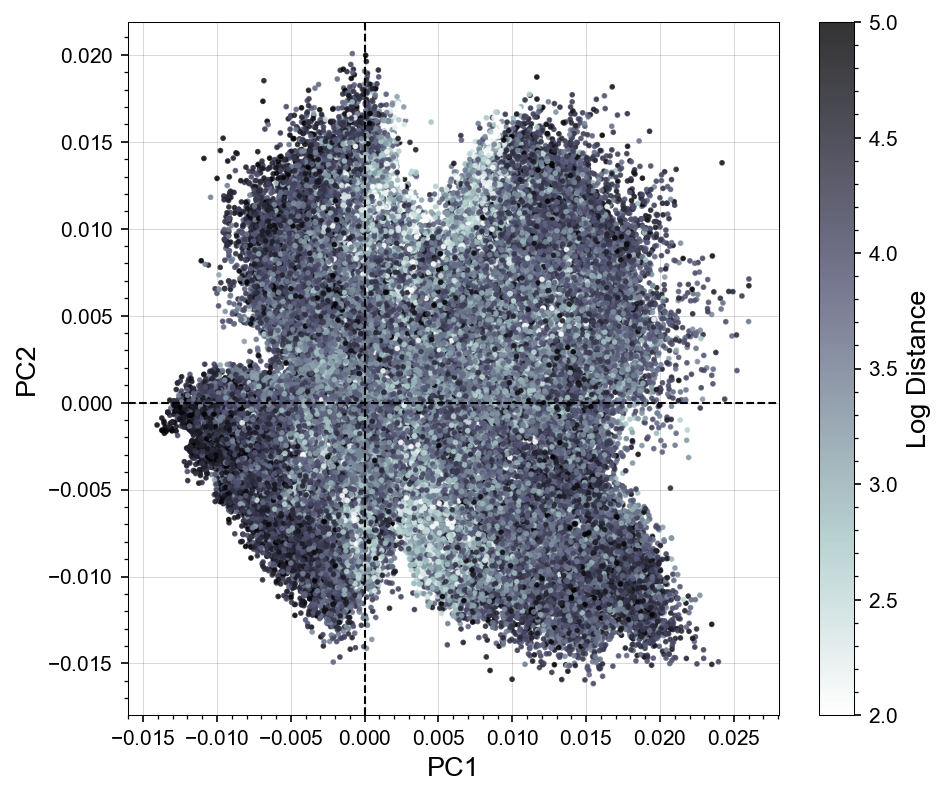

In [46]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.LogDistance.clip(2, 5), cmap='bone_r', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Log Distance')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

In [ ]:
kmeans = skl.cluster.KMeans(3).fit_transform(df)
kmeans

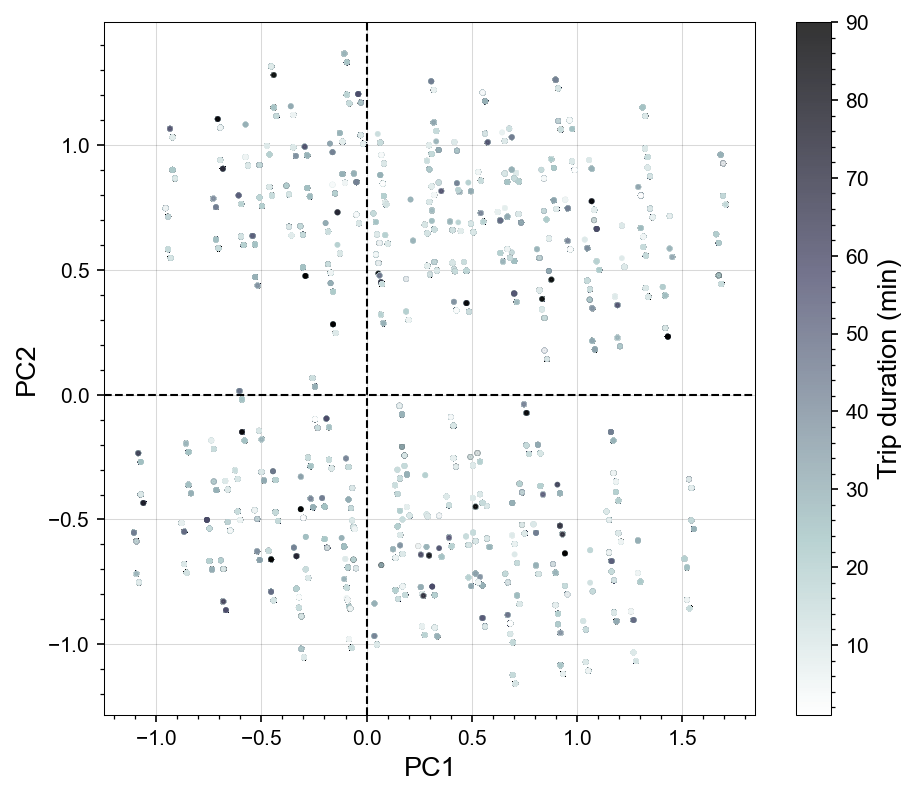

In [ ]:
pca = skl.decomposition.PCA(18)
df2 = pd.get_dummies(trips.loc[:, 'AgeGrp': 'HomeOwn'])
df2 = Pdf(pca.fit_transform(df2)[:, :2], columns=['pc1', 'pc2'])
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df2.pc1, df2.pc2, c=trips.Duration.values.clip(0, 90), cmap='bone_r', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Trip duration (min)')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)